In [240]:
#conda install --channel conda-forge geopandas
#conda install descartes
#conda update -n base -c defaults conda

In [17]:
import numpy as np

In [241]:
import pandas as pd

In [9]:
import geopandas as gpd

In [242]:
#import os
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib.patches import PathPatch
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar
from bokeh.palettes import brewer

In [ ]:
import json

In [ ]:
#get data on current covid cases
data = pd.read_csv('covid_cases.txt')

In [303]:
#transform data to show number of cases per state and name the new dataframe province
province_grouped = data['province/state'].value_counts()
province = pd.DataFrame(province_grouped)
province['province'] = province.index
province.columns = ['number_of_cases','province']
#province

In [304]:
#get the shapefile for mapping
nm = gpd.read_file('C:/Users/eb808/Downloads/ngaadmbndaadm1osgof/nga_admbnda_adm1_osgof/nga_admbnda_adm1_osgof_20161215.shp')

In [305]:
#extract necessary columns
nm = nm[['admin1Name','geometry']]

In [306]:
#rename columns
nm.columns = ['STATE', 'geometry']

In [307]:
#Change state names to be compatible with other data
list_of_states = nm['STATE'].tolist()
list_of_states[14] = 'Abuja'
list_of_states[25] = 'Nassarawa'

In [308]:
#create a column in geopandas feodataframe containing information about number of cases

nofcases = province['number_of_cases'].tolist()
provincelist = province['province'].tolist()

casesinprovincelist = []

for state in list_of_states:
    if state in provincelist:
        index = provincelist.index(state)
        casesinprovincelist.append(nofcases[index])
    else:
        casesinprovincelist.append(0)
nm['number_of_cases']=casesinprovincelist

In [309]:
#Read data to json.
nm_json = json.loads(nm.to_json())
#Convert to String like object.
json_data = json.dumps(nm_json)

In [310]:
# create variable that that contain json format for geophysical data
geosource = GeoJSONDataSource(geojson = json_data)

In [311]:
#Define a sequential multi-hue color palette.
palette = brewer['OrRd'][9]
#Reverse color order so that dark blue is highest obesity.
palette = palette[::-1]

In [312]:
#create a color scheme

case_color = []

for number in nofcases_list:
    if number <= max_n*0.10:
        case_color.append(palette[0])
    elif number <= max_n*0.2:
        case_color.append(palette[1])
    elif number <= max_n*0.3:
        case_color.append(palette[2])
    elif number <= max_n*0.4:
        case_color.append(palette[3])
    elif number <= max_n*0.5:
        case_color.append(palette[4])
    elif number <= max_n*0.6:
        case_color.append(palette[5])
    elif number <= max_n*0.7:
        case_color.append(palette[6])  
    elif number <= max_n*0.8:
        case_color.append(palette[7])
    else:
        case_color.append(palette[8])

case_color

['#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fee8c8',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fdbb84',
 '#fdbb84',
 '#fee8c8',
 '#f

In [313]:
#create the map:

#Create color bar. 
color_mapper = LinearColorMapper(palette = palette, low = 200, high = (nigeria_map['number_of_cases'].max()*0.8))
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20, 
                     border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)

p = figure(title = 'Covid Cases in Nigeria 2020', plot_height = 650 , plot_width = 750, toolbar_location = None)
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
p.patches('xs','ys', source = geosource, fill_color = {'field' :'number_of_cases', 'transform' : color_mapper},
          line_color = "black", line_width = 0.05, fill_alpha = 1)
#Specify figure layout.
p.add_layout(color_bar, 'below')

p.title.text_font_size = '25pt'

show(p)

In [6]:
nigeria_map = gpd.read_file('C:/Users/eb808/Downloads/nigeria-lgas/new_lga_nigeria_2003.shp')
data = pd.read_csv('covid_cases.txt')

In [10]:
data = pd.read_csv('covid_cases.txt')

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6401 entries, 0 to 6400
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   case_id                  6401 non-null   int64  
 1   origin_case_id           0 non-null      float64
 2   date                     6401 non-null   object 
 3   age                      10 non-null     object 
 4   gender                   12 non-null     object 
 5   city                     16 non-null     object 
 6   province/state           6401 non-null   object 
 7   country                  6401 non-null   object 
 8   current_status           381 non-null    object 
 9   source                   6401 non-null   object 
 10  symptoms                 384 non-null    object 
 11  date_onset_symptoms      1 non-null      object 
 12  date_admission_hospital  4 non-null      object 
 13  date_confirmation        27 non-null     object 
 14  underlying_conditions   

In [18]:
provincelist = data['province/state'].tolist()
np.unique(provincelist)

array(['Abia', 'Abuja', 'Adamawa', 'Akwa Ibom', 'Anambra', 'Bauchi',
       'Bayelsa', 'Benue', 'Borno', 'Delta', 'Ebonyi', 'Edo', 'Ekiti',
       'Enugu', 'Gombe', 'Imo', 'Jigawa', 'Kaduna', 'Kano', 'Katsina',
       'Kebbi', 'Kwara', 'Lagos', 'Nasarawa', 'Niger', 'Ogun', 'Ondo',
       'Osun', 'Oyo', 'Plateau', 'Rivers', 'Sokoto', 'Taraba', 'Yobe',
       'Zamfara'], dtype='<U9')

In [19]:
uniquestates = np.unique(nigeria_map['STATE'].tolist())
uniquestates

array(['Abia', 'Abuja', 'Adamawa', 'Akwa Ibom', 'Anambra', 'Bauchi',
       'Bayelsa', 'Benue', 'Borno', 'Cross River', 'Delta', 'Ebonyi',
       'Edo', 'Ekiti', 'Enugu', 'Gombe', 'Imo', 'Jigawa', 'Kaduna',
       'Kano', 'Katsina', 'Kebbi', 'Kogi', 'Kwara', 'Lagos', 'Lake',
       'Nassarawa', 'Niger', 'Ogun', 'Ondo', 'Osun', 'Oyo', 'Plateau',
       'Rivers', 'Sokoto', 'Taraba', 'Yobe', 'Zamfara'], dtype='<U11')

In [20]:
province_grouped = data['province/state'].value_counts()
province = pd.DataFrame(province_grouped)
province['province'] = province.index
province.columns = ['number_of_cases','province']
province

,number_of_cases,province
Lagos,2756,Lagos
Kano,842,Kano
Abuja,427,Abuja
Katsina,281,Katsina
Borno,227,Borno
Bauchi,224,Bauchi
Jigawa,205,Jigawa
Ogun,177,Ogun
Kaduna,152,Kaduna
Oyo,143,Oyo


In [44]:
'''map_data = nigeria_map.merge(province, on = 'province')
map_data'''

"map_data = nigeria_map.merge(province, on = 'province')\nmap_data"

In [80]:
statelist = nigeria_map['STATE'].tolist()

In [48]:
statelist[19]

'Kebbi'

In [52]:
nofcases = province['number_of_cases'].tolist()
provincelist = province['province'].tolist()

casesinprovincelist = []

for state in statelist:
    if state in provincelist:
        index = provincelist.index(state)
        casesinprovincelist.append(nofcases[index])
    else:
        casesinprovincelist.append(0)
nigeria_map['number_of_cases'] = casesinprovincelist

In [53]:
nigeria_map.to_file(r'C:/Users/eb808/Downloads/nigeria-lgas/nigeria_map.shp')

In [27]:
pip install pyshp

  Created wheel for pyshp: filename=pyshp-2.1.0-py3-none-any.whl size=32612 sha256=446c2758206ea7683a936f3ed1da40db43e90ac546e6c4f8ff6a02b8cbae646a
  Stored in directory: c:\users\eb808\appdata\local\pip\cache\wheels\a0\c5\f3\548a073ac6a83d5b23d9b39cdd24314fc84bc8afc9882deb33
Successfully built pyshp
Note: you may need to restart the kernel to use updated packages.


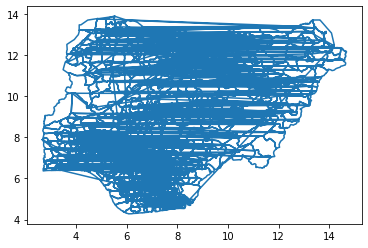

In [31]:
import matplotlib.pyplot as plt
import shapefile   

shpFilePath = 'C:/Users/eb808/Downloads/nigeria-lgas/new_lga_nigeria_2003.shp'
listx=[]
listy=[]
test = shapefile.Reader(shpFilePath)
for sr in test.shapeRecords():
    for xNew,yNew in sr.shape.points:
        listx.append(xNew)
        listy.append(yNew)
plt.plot(listx,listy)
plt.show()

In [55]:
nigeria_map.columns

Index(['STATE', 'LGA', 'AREA', 'PERIMETER', 'LONGITUDE', 'LATITUDE',
       'FULL_NAME', 'geometry', 'number_of_cases'],
      dtype='object')

In [57]:
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib.patches import PathPatch

In [56]:
sf = shapefile.Reader('C:/Users/eb808/Downloads/nigeria-lgas/nigeria_map.shp')

plt.figure(figsize=(200,160))
for shape in sf.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]
    y = [i[1] for i in shape.shape.points[:]]
    plt.plot(x,y, linewidth = 5, color = 'black')
            
    ax.add_collection(PatchCollection(patches, facecolor= 'm', edgecolor='k', linewidths=1., zorder=2))
plt.show()

NameError: name 'red' is not defined

<Figure size 14400x11520 with 0 Axes>

In [ ]:
from mpl_toolkits.basemap import Basemap


for info, shape in zip(map.comarques_info, map.comarques):
    if info['nombre'] == 'Selva':
        x, y = zip(*shape) 
        map.plot(x, y, marker=None,color='m')
plt.show()


fig     = plt.figure()
ax      = fig.add_subplot(111)



patches   = []

for info, shape in zip(map.comarques_info, map.comarques):
    if info['nombre'] == 'Selva':
        patches.append( Polygon(np.array(shape), True) )
        
ax.add_collection(PatchCollection(patches, facecolor= 'm', edgecolor='k', linewidths=1., zorder=2))

plt.show()

In [76]:
nigeria_map.plot(ax = ax, color = 'r')

<Figure size 432x288 with 0 Axes>

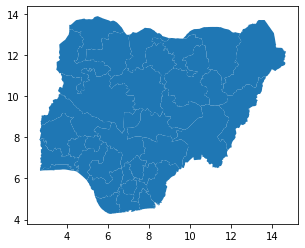

In [279]:
nm.plot()

In [281]:
lakemask = nigeria_map['STATE'] =='Lake'
nigeria_map['number_of_cases']

0      113
1      113
2      113
3      227
4        0
      ... 
770     27
771     22
772     32
773     84
774     18
Name: number_of_cases, Length: 775, dtype: int64

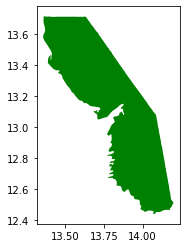

In [276]:
ax = nigeria_map[nigeria_map['STATE'] == 'Lake'].plot(color = 'g')

In [77]:
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar
from bokeh.palettes import brewer
#Define a sequential multi-hue color palette.
palette = brewer['OrRd'][9]
#Reverse color order so that dark blue is highest obesity.
palette = palette[::-1]

In [225]:
#Define a sequential multi-hue color palette.
palette = brewer['OrRd'][9]
#Reverse color order so that dark blue is highest obesity.
palette = palette[::-1]

In [203]:
#import json
#Read data to json.
merged_json = json.loads(nigeria_map_jsn.to_json())
#Convert to String like object.
json_data = json.dumps(merged_json)

In [204]:
json_data

'{"type": "FeatureCollection", "features": [{"id": "0", "type": "Feature", "properties": {"LGA": "Gada", "PERIMETER": 170.095, "STATE": "Sokoto", "number_of_cases": 113}, "geometry": {"type": "Polygon", "coordinates": [[[5.536319255828857, 13.887928009033203], [5.534797668457031, 13.88488483428955], [5.5347185134887695, 13.884725570678711], [5.532425880432129, 13.881149291992188], [5.528310298919678, 13.874869346618652], [5.5241804122924805, 13.869513511657715], [5.522242069244385, 13.858644485473633], [5.519338607788086, 13.849609375], [5.516212463378906, 13.839879989624023], [5.516621112823486, 13.828577041625977], [5.515718460083008, 13.811258316040039], [5.511843681335449, 13.804520606994629], [5.509440898895264, 13.793415069580078], [5.506566047668457, 13.7825345993042], [5.508355140686035, 13.7576322555542], [5.508472442626953, 13.750018119812012], [5.512810230255127, 13.726760864257812], [5.512722015380859, 13.71729850769043], [5.518601417541504, 13.70029067993164], [5.521087646

In [84]:
nigeria_map_jsn = nigeria_map[['STATE', 'LGA', 'PERIMETER', 'geometry', 'number_of_cases']]

In [65]:
from matplotlib.collections import PatchCollection

In [286]:
geosource = GeoJSONDataSource(geojson = json_data)

In [289]:
#Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
color_mapper = LinearColorMapper(palette = palette, low = 200, high = 2000)
#Define custom tick labels for color bar.
tick_labels = {'0': '0%', '5': '5%', '10':'10%', '15':'15%', '20':'20%', '25':'25%', '30':'30%','35':'35%', '40': '>40%'}
#Create color bar. 
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)
#Create figure object.
p = figure(title = 'Share of adults who are obese, 2016', plot_height = 600 , plot_width = 950, toolbar_location = None)
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
#Add patch renderer to figure. 
p.patches('xs','ys', source = geosource,fill_color = {'field' :'per_cent_obesity', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)
#Specify figure layout.
p.add_layout(color_bar, 'below')
#Display figure inline in Jupyter Notebook.
output_notebook()
#Display figure.
show(p)

Loading BokehJS ...

In [88]:
from bokeh.io import output_notebook

In [90]:
output_notebook()

Loading BokehJS ...

In [106]:
#max_n = nigeria_map['number_of_cases'].max()
sorted_n = np.sort(nigeria_map['number_of_cases'])
i = len(sorted_n)/5

In [110]:
nofcases_list = nigeria_map['number_of_cases'].tolist()

In [223]:
palette[9]

IndexError: tuple index out of range

In [288]:
case_color = []
for number in nofcases_list:
    if number <= max_n*0.10:
        case_color.append(palette[0])
    elif number <= max_n*0.2:
        case_color.append(palette[1])
    elif number <= max_n*0.3:
        case_color.append(palette[2])
    elif number <= max_n*0.4:
        case_color.append(palette[3])
    elif number <= max_n*0.5:
        case_color.append(palette[4])
    elif number <= max_n*0.6:
        case_color.append(palette[5])
    elif number <= max_n*0.7:
        case_color.append(palette[6])  
    elif number <= max_n*0.8:
        case_color.append(palette[7])
    else:
        case_color.append(palette[8])

case_color
    

['#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fee8c8',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fff7ec',
 '#fff7ec',
 '#fee8c8',
 '#fff7ec',
 '#fdbb84',
 '#fdbb84',
 '#fee8c8',
 '#f

In [263]:
geosource = GeoJSONDataSource(geojson = json_data)

In [295]:
#Create color bar.
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20, 
                    border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)

color_mapper = LinearColorMapper(palette = palette, low = 200, high = (nm['number_of_cases'].max()))

#Define custom tick labels for color bar.
#tick_labels = {'0': '0%', '5': '5%', '10':'10%', '15':'15%', '20':'20%', '25':'25%', '30':'30%','35':'35%', '40': '>40%'}
#Create color bar. 

p = figure(title = 'Covid Cases in Nigeria 2020', plot_height = 650 , plot_width = 750, toolbar_location = None)
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
p.patches('xs','ys', source = geosource, line_color = "black", line_width = 0.15, fill_alpha = 1)
#Specify figure layout.
p.add_layout(color_bar, 'below')

p.title.text_font_size = '25pt'

show(p)

In [257]:
nm

,STATE,geometry
0,Abia,"POLYGON ((7.38681 6.03667, 7.38729 6.03605, 7...."
1,Adamawa,"POLYGON ((13.62129 10.94823, 13.62592 10.94822..."
2,Akwa Ibom,"MULTIPOLYGON (((8.34482 4.61140, 8.34496 4.609..."
3,Anambra,"POLYGON ((6.93254 6.71090, 6.93167 6.69870, 6...."
4,Bauchi,"POLYGON ((10.75125 12.46148, 10.75615 12.39191..."
5,Bayelsa,"POLYGON ((6.55283 5.37988, 6.56198 5.37925, 6...."
6,Benue,"POLYGON ((8.52442 8.15727, 8.54240 8.14873, 8...."
7,Borno,"POLYGON ((13.35885 13.71261, 13.36207 13.71153..."
8,Cross River,"MULTIPOLYGON (((8.56068 4.79847, 8.55944 4.798..."
9,Delta,"POLYGON ((6.66892 6.50123, 6.67111 6.48484, 6...."


In [294]:
nigeria_map

,STATE,LGA,AREA,PERIMETER,LONGITUDE,LATITUDE,FULL_NAME,geometry,number_of_cases
0,Sokoto,Gada,1193.977,170.095,None,None,None,"POLYGON ((5.53632 13.88793, 5.53480 13.88488, ...",113
1,Sokoto,Illela,1298.423,174.726,None,None,None,"POLYGON ((5.53632 13.88793, 5.54517 13.88419, ...",113
2,Sokoto,Tangaza,2460.715,209.702,None,None,None,"POLYGON ((4.85548 13.76724, 4.86189 13.78085, ...",113
3,Borno,Abadam,2430.515,288.957,None,None,None,"POLYGON ((12.83189 13.39871, 12.83397 13.40439...",227
4,Lake,Lake chad,5225.912,497.039,None,None,None,"POLYGON ((13.48608 13.30821, 13.48296 13.31344...",0
...,...,...,...,...,...,...,...,...,...
770,Delta,Isoko North,485.467,169.369,None,None,None,"MULTIPOLYGON (((6.31996 5.63341, 6.32003 5.633...",27
771,Niger,Lavun,3951.431,424.153,None,None,None,"MULTIPOLYGON (((6.12188 9.09441, 6.12001 9.094...",22
772,Yobe,Bade,817.260,216.207,None,None,None,"MULTIPOLYGON (((11.01052 12.80457, 11.00747 12...",32
773,Zamfara,Maru,7795.261,536.500,None,None,None,"MULTIPOLYGON (((6.43894 12.41104, 6.43609 12.4...",84


In [296]:
#Create color bar. 
color_mapper = LinearColorMapper(palette = palette, low = 200, high = (nigeria_map['number_of_cases'].max()*0.8))
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20, 
                     border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)
#Define custom tick labels for color bar.
#tick_labels = {'0': '0%', '5': '5%', '10':'10%', '15':'15%', '20':'20%', '25':'25%', '30':'30%','35':'35%', '40': '>40%'}
#Create color bar. 

p = figure(title = 'Covid Cases in Nigeria 2020', plot_height = 650 , plot_width = 750, toolbar_location = None)
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
p.patches('xs','ys', source = geosource, fill_color = {'field' :'number_of_cases', 'transform' : color_mapper},
          line_color = "black", line_width = 0.05, fill_alpha = 1)
#Specify figure layout.
p.add_layout(color_bar, 'below')

p.title.text_font_size = '25pt'

show(p)

In [130]:
Sokoto = nigeria_map[nigeria_map['STATE']== 'Sokoto']
sokoto_polygons = Sokoto.geometry.tolist()

In [132]:
from shapely.ops import cascaded_union
polygons = sokoto_polygons
boundary = gpd.GeoSeries(cascaded_union(polygons))
boundary

0    POLYGON ((5.03798 12.23036, 5.03406 12.21284, ...
dtype: geometry

In [140]:
states = np.unique(nigeria_map['STATE'].tolist())
state_polygons = []

for state in states:
    one_state = nigeria_map[nigeria_map['STATE'] == state]
    polygons = one_state.geometry.tolist()
    boundary = gpd.GeoSeries(cascaded_union(polygons))
    state_polygons.append(boundary)
state_polygons

AttributeError: 'list' object has no attribute 'plot'

In [153]:
nigeria_states_map = pd.DataFrame(states)
nigeria_states_map['geometry'] = state_polygons
nigeria_states_map.columns = ('STATE', 'geometry')



In [154]:
nigeria_states_map

,STATE,geometry
0,Abia,"0 POLYGON ((7.49347 5.02299, 7.48653 5.0198..."
1,Abuja,"0 POLYGON ((7.47107 8.63921, 7.46995 8.6354..."
2,Adamawa,"0 POLYGON ((12.25440 8.24566, 12.25748 8.22..."
3,Akwa Ibom,"0 POLYGON ((7.82829 4.52250, 7.81300 4.5201..."
4,Anambra,"0 POLYGON ((7.35040 6.02385, 7.35031 6.0234..."
5,Bauchi,"0 POLYGON ((10.84770 10.19714, 10.83488 10...."
6,Bayelsa,"0 POLYGON ((6.62139 4.72707, 6.62335 4.7229..."
7,Benue,"0 POLYGON ((9.84107 7.59561, 9.84444 7.5931..."
8,Borno,"0 POLYGON ((12.35240 10.27406, 12.34276 10...."
9,Cross River,"0 POLYGON ((8.62125 4.85323, 8.62398 4.8509..."


In [160]:
provincelist.sort()
provincelist

['Abia',
 'Abuja',
 'Adamawa',
 'Akwa Ibom',
 'Anambra',
 'Bauchi',
 'Bayelsa',
 'Benue',
 'Borno',
 'Delta',
 'Ebonyi',
 'Edo',
 'Ekiti',
 'Enugu',
 'Gombe',
 'Imo',
 'Jigawa',
 'Kaduna',
 'Kano',
 'Katsina',
 'Kebbi',
 'Kwara',
 'Lagos',
 'Nasarawa',
 'Niger',
 'Ogun',
 'Ondo',
 'Osun',
 'Oyo',
 'Plateau',
 'Rivers',
 'Sokoto',
 'Taraba',
 'Yobe',
 'Zamfara']

In [175]:
nofcases = province['number_of_cases'].tolist()
provincelist = province['province'].tolist()

casesinprovincelist = []

for state in states:
    if state in provincelist:
        index = provincelist.index(state)
        casesinprovincelist.append(nofcases[index])
    else:
        casesinprovincelist.append(0)
nigeria_states_map['number_of_cases'] = casesinprovincelist

nigeria_states_map

,STATE,geometry,number_of_cases
0,Abia,"0 POLYGON ((7.49347 5.02299, 7.48653 5.0198...",5
1,Abuja,"0 POLYGON ((7.47107 8.63921, 7.46995 8.6354...",427
2,Adamawa,"0 POLYGON ((12.25440 8.24566, 12.25748 8.22...",26
3,Akwa Ibom,"0 POLYGON ((7.82829 4.52250, 7.81300 4.5201...",18
4,Anambra,"0 POLYGON ((7.35040 6.02385, 7.35031 6.0234...",5
5,Bauchi,"0 POLYGON ((10.84770 10.19714, 10.83488 10....",224
6,Bayelsa,"0 POLYGON ((6.62139 4.72707, 6.62335 4.7229...",7
7,Benue,"0 POLYGON ((9.84107 7.59561, 9.84444 7.5931...",5
8,Borno,"0 POLYGON ((12.35240 10.27406, 12.34276 10....",227
9,Cross River,"0 POLYGON ((8.62125 4.85323, 8.62398 4.8509...",0


In [169]:
type(nigeria_states_map)

pandas.core.frame.DataFrame

In [168]:
type(nigeria_map_jsn)

geopandas.geodataframe.GeoDataFrame

In [170]:
nigeria_map_jsn

,STATE,LGA,PERIMETER,geometry,number_of_cases
0,Sokoto,Gada,170.095,"POLYGON ((5.53632 13.88793, 5.53480 13.88488, ...",113
1,Sokoto,Illela,174.726,"POLYGON ((5.53632 13.88793, 5.54517 13.88419, ...",113
2,Sokoto,Tangaza,209.702,"POLYGON ((4.85548 13.76724, 4.86189 13.78085, ...",113
3,Borno,Abadam,288.957,"POLYGON ((12.83189 13.39871, 12.83397 13.40439...",227
4,Lake,Lake chad,497.039,"POLYGON ((13.48608 13.30821, 13.48296 13.31344...",0
...,...,...,...,...,...
770,Delta,Isoko North,169.369,"MULTIPOLYGON (((6.31996 5.63341, 6.32003 5.633...",27
771,Niger,Lavun,424.153,"MULTIPOLYGON (((6.12188 9.09441, 6.12001 9.094...",22
772,Yobe,Bade,216.207,"MULTIPOLYGON (((11.01052 12.80457, 11.00747 12...",32
773,Zamfara,Maru,536.500,"MULTIPOLYGON (((6.43894 12.41104, 6.43609 12.4...",84


In [167]:
result = nigeria_states_map.to_json()
merged_json = json.loads(result)
#Convert to String like object.
json_data = json.dumps(merged_json, indent = 4)

OverflowError: Maximum recursion level reached

In [188]:
states_nigeria_map = nigeria_map_jsn.copy()
stat_list = nigeria_states_map['STATE'].tolist()
geom = states_nigeria_map['geometry'].tolist()
states_list = states_nigeria_map['STATE'].tolist()
new_polygons = []

for state in states_list:
    stateindex = stat_list.index(state)
    new_polygons.append(state_polygons[stateindex])
    
len(new_polygons)

775

In [200]:
states_nigeria_map.columns = ['STATE', 'number_of_cases', 'geometry']

In [202]:
states_nigeria_map

ValueError: Unknown geometry type: featurecollection

ValueError: Unknown geometry type: featurecollection

In [201]:
#states_nigeria_map['geom'] = new_polygons
#states_nigeria_map.drop('geometry', axis = 1, inplace=True)
#states_nigeria_map.drop('LGA', axis = 1, inplace = True)
#states_nigeria_map.drop('PERIMETER', axis = 1, inplace = True)
result = states_nigeria_map.to_json()
merged_json = json.loads(result)
#Convert to String like object.
json_data = json.dumps(merged_json)

ValueError: The truth value of a GeoSeries is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [185]:
type(provincelist)

list

In [ ]:
nofcases = province['number_of_cases'].tolist()
provincelist = province['province'].tolist()

casesinprovincelist = []

for state in statelist:
    if state in provincelist:
        index = provincelist.index(state)
        casesinprovincelist.append(nofcases[index])
    else:
        casesinprovincelist.append(0)
nigeria_map['number_of_cases'] = casesinprovincelist